# Examples from MIMIC-CXR

In [13]:
from medvqa.utils.files import load_pickle, read_txt
from medvqa.datasets.mimiccxr import load_mimiccxr_reports_detailed_metadata, get_mimiccxr_large_image_path
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import load_nondecent_chest_imagenome_dicom_ids
from tqdm import tqdm
import random

In [6]:
nondecent_dicom_ids = set(load_nondecent_chest_imagenome_dicom_ids())
len(nondecent_dicom_ids)

1030

In [4]:
metadata = load_mimiccxr_reports_detailed_metadata()

In [7]:
train_ridxs_with_noisy_images = []
val_ridxs_with_noisy_images = []
test_ridxs_with_noisy_images = []
for ridx, (dicom_id_view_pos_pairs, split) in enumerate(zip(
        metadata['dicom_id_view_pos_pairs'], metadata['splits'])):
    noisy = False
    for dicom_id, _ in dicom_id_view_pos_pairs:
        if dicom_id in nondecent_dicom_ids:
            noisy = True
            break
    if noisy:
        if split == 'train':
            train_ridxs_with_noisy_images.append(ridx)
        elif split == 'validate':
            val_ridxs_with_noisy_images.append(ridx)
        elif split == 'test':
            test_ridxs_with_noisy_images.append(ridx)
        else: assert False
print(f'len(train_ridxs_with_noisy_images) = {len(train_ridxs_with_noisy_images)}')
print(f'len(val_ridxs_with_noisy_images) = {len(val_ridxs_with_noisy_images)}')
print(f'len(test_ridxs_with_noisy_images) = {len(test_ridxs_with_noisy_images)}')

len(train_ridxs_with_noisy_images) = 951
len(val_ridxs_with_noisy_images) = 11
len(test_ridxs_with_noisy_images) = 13


In [8]:
def get_report_text_and_images(ridx):
    part_id = metadata['part_ids'][ridx]
    subject_id = metadata['subject_ids'][ridx]
    study_id = metadata['study_ids'][ridx]
    dicom_id_view_pos_pairs = metadata['dicom_id_view_pos_pairs'][ridx]
    image_paths = [get_mimiccxr_large_image_path(part_id, subject_id, study_id, dicom_id) for dicom_id, _ in dicom_id_view_pos_pairs]
    report_text = read_txt(metadata['filepaths'][ridx])
    return report_text, image_paths

In [9]:
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display, Markdown
import math

# Function to display the radiology report and images
def visualize_report_and_images(report_text, image_paths):
    # Display the report text
    display(Markdown("### Radiology Report"))
    display(Markdown(f"```\n{report_text.strip()}\n```"))
    
    # Determine grid layout
    max_columns = min(2, len(image_paths))
    num_images = len(image_paths)
    num_rows = math.ceil(num_images / max_columns)
    
    # Create subplots for the grid
    fig, axes = plt.subplots(num_rows, max_columns, figsize=(12, 6 * num_rows), squeeze=False)
    axes = axes.flatten()  # Flatten to simplify iteration
    
    # Load and display images
    for idx, image_path in enumerate(image_paths):
        img = Image.open(image_path)
        axes[idx].imshow(img, cmap="gray")
        axes[idx].axis("off")
    
    # Hide any unused subplots
    for idx in range(num_images, len(axes)):
        axes[idx].axis("off")
    
    plt.tight_layout()
    plt.show()

# 1) Examples from MIMIC-CXR training set

ridx: 18668
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10374990/s59204590/2878ea30-0aa8442b-857dbc9b-97281077-84d3d1e2.jpg


### Radiology Report

```
FINAL REPORT
 EXAMINATION:  CHEST (PORTABLE AP)
 
 INDICATION:  ___ year old woman with pleural effusion and white count, now s/p
 chest tube placement.  // complications from chest tube placement.
 
 TECHNIQUE:  Single AP radiograph of the chest.
 
 COMPARISON:  Chest radiograph dated ___.
 
 FINDINGS: 
 
 The patient is status post aortic valve replacement.  The right IJ catheter is
 unchanged in positioning.  There has been interval placement of a right chest
 tube, however it is unclear from this radiograph if this tube is actually in
 the pleural space.  A continues to be a large loculated right pleural
 effusion, which has decreased in size compared to the prior radiograph.  The
 left lung continues to be essentially clear.  The cardiomediastinal silhouette
 is stable.  There is no definite pneumothorax.  Surgical fixation hardware is
 unchanged.
 
 IMPRESSION: 
 
 Interval placement of a right chest tube, which appears more inferior than
 typically expected.  There has been interval decrease of the large right
 pleural effusion, however based on this radiograph, it is not certain if this
 catheter is actually within the pleural space.
 
 NOTIFICATION:   The findings were discussed with ___, M.D. by
 ___, M.D. on the telephone on ___ at 5:15 PM, 10 minutes
 after discovery of the findings.
```

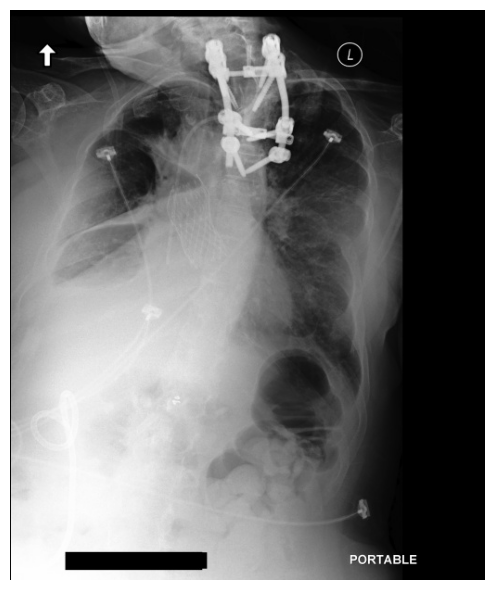

In [14]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

### Example 1.2

ridx: 217689
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19559574/s58923945/aa5c65bb-deeb29d4-d7ffbea1-09eea417-9e6b155e.jpg


### Radiology Report

```
FINAL REPORT
 INDICATION:   ___F with hypoxia  // acute process?
 
 TECHNIQUE:  Single portable view of the chest.
 
 COMPARISON:  Prior film from earlier the same day at 18:19.
 
 FINDINGS: 
 
 Endotracheal tube tip is 5.8 cm from the carina.  Enteric tube passes below
 the field of view.  Catheter projects over the right chest wall and abdomen,
 potentially a ventricular shunt.  Diffuse bilateral parenchymal opacities seen
 in the lungs, right greater than left.  The cardiomediastinal silhouette is
 within normal limits.  No acute osseous abnormalities.
 
 IMPRESSION: 
 
 Diffuse bilateral parenchymal opacities in the lungs.  This could be due to
 multi focal pneumonia, edema, or ARDS.
```

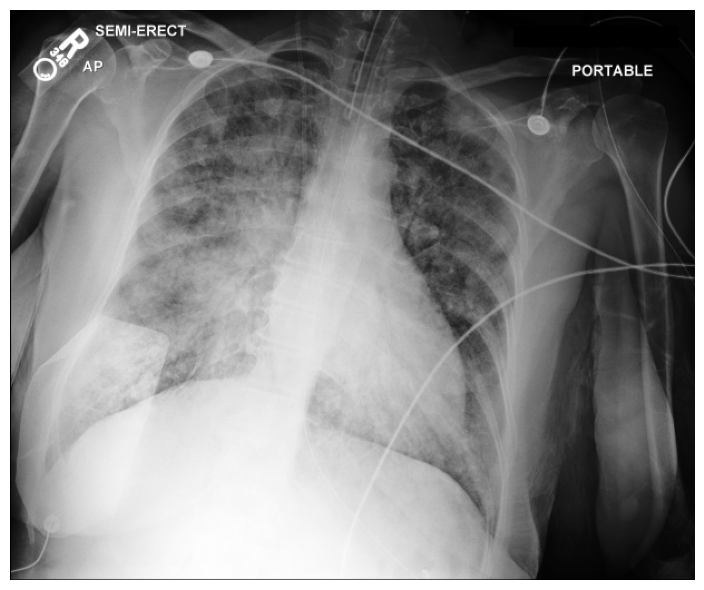

In [15]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 103672
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p14/p14871428/s50305707/af834ce8-18a6adee-27144854-45441e46-bef2a567.jpg


### Radiology Report

```
FINAL REPORT
 HISTORY:  CABG, to assess for pneumothorax.
 
 FINDINGS:  In comparison with the study of ___, there is no evidence of
 pneumothorax.  The right IJ catheter has been removed and a nasogastric tube
 inserted with its tip extending at least to the upper stomach where it crosses
 the lower margin of the image.
 
 Little overall change in the appearance of the heart and lungs.
```

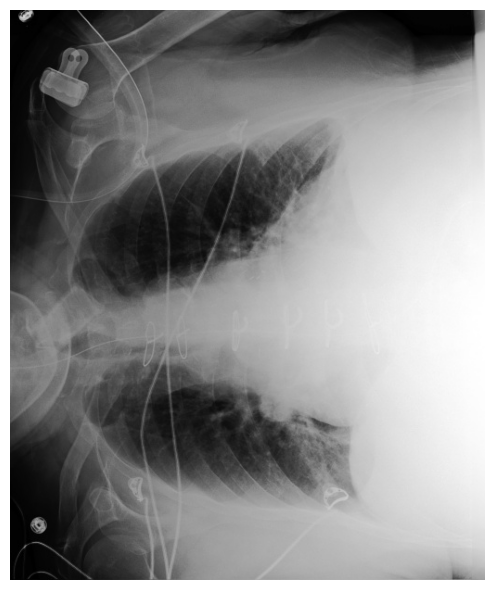

In [16]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 101476
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p14/p14800294/s52676377/8a507528-e3c35765-3c5e15df-0684d6bd-60988c71.jpg


### Radiology Report

```
FINAL REPORT
 CHEST RADIOGRAPH
 
 INDICATION:  Status post ___ placement.
 
 COMPARISON:  No comparison available at the time of dictation.
 
 FINDINGS:  The radiograph documents placement of ___ ___ device.  The
 patient is intubated, with the tip of the endotracheal tube projecting
 approximately 2 cm above the carina.  The lung volumes are very low and show
 moderate cardiomegaly as well as bilateral parenchymal opacities, most likely
 reflecting atelectasis.  However, close radiographic followup must be
 performed to exclude other potential causes such as aspiration, pneumonia, or
 a combination of both.  Moderate-to-severe cardiomegaly but no substantial
 vascular enlargement.
```

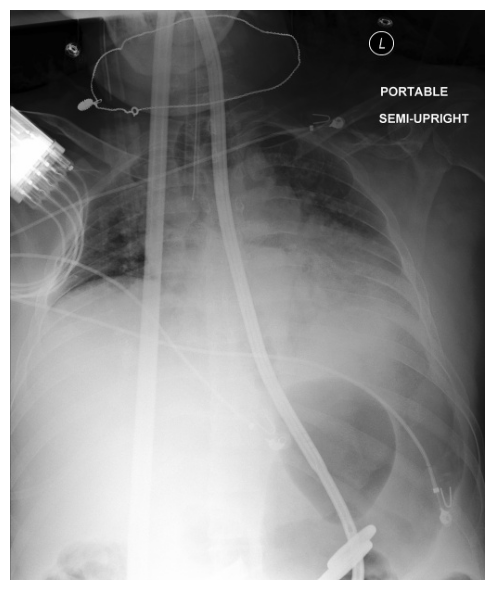

In [17]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 8018
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10411588/s58606661/324b63b8-5b119586-3760e9d6-0abfee35-172a4502.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10411588/s58606661/397e18e8-59f23746-8f588e97-8f0c0c62-142ef518.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10411588/s58606661/ad7a650f-e63356f4-6712fffd-8048e052-aa88a25f.jpg


### Radiology Report

```
FINAL REPORT
 EXAMINATION:  PA and lateral chest radiograph
 
 INDICATION:  ___ year old man with fevers, CNS whipple disease, poor lung
 volumes on prior CXR  // eval for infiltrate, pna
 
 COMPARISON:  Chest radiograph dated ___ and ___.
 
 FINDINGS: 
 
 The right PICC line ends in the lower SVC, overall unchanged.  Lung volumes
 remain low.  Atelectasis of the left lung base is mild.  Heart size is mildly
 enlarged, unchanged.  No definite pleural effusion or focal consolidation to
 suggest pneumonia.  No pneumothorax.
 
 IMPRESSION: 
 
 No significant interval change - low lung volumes and no definite focal
 consolidation to suggest pneumonia.
```

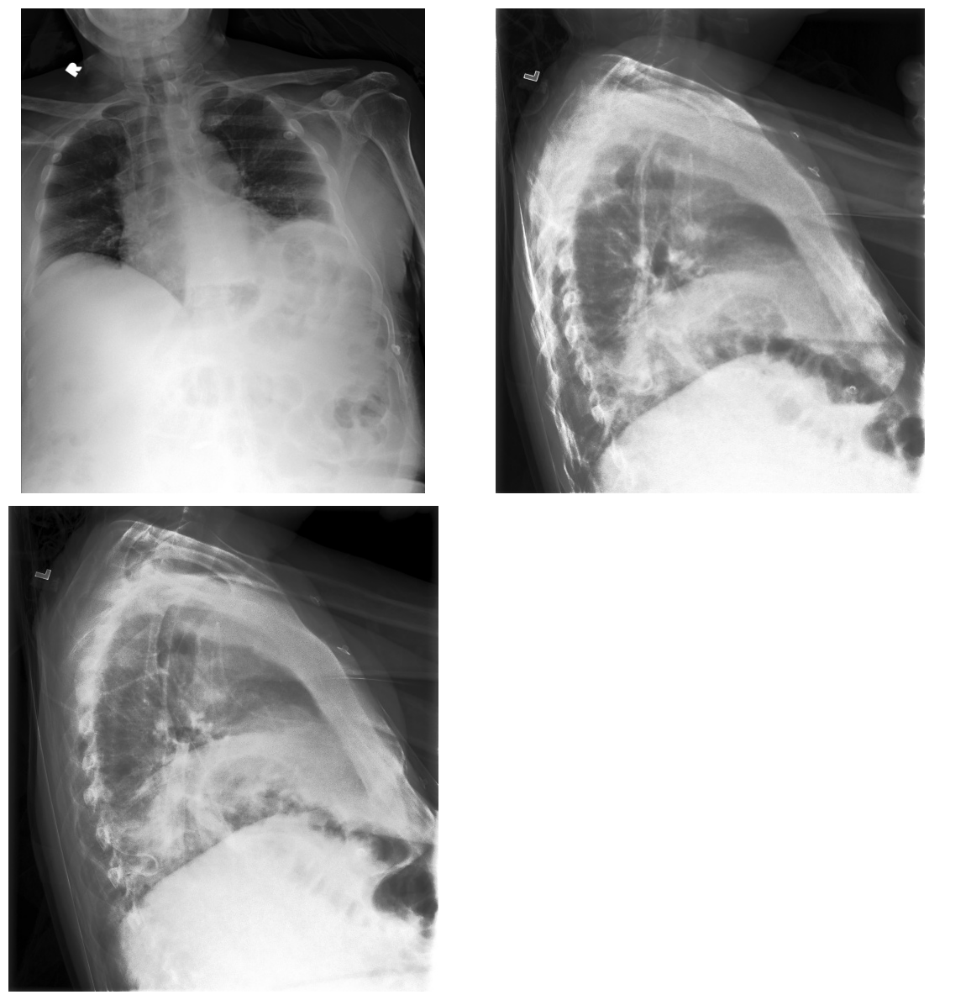

In [18]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 60396
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12128253/s55839022/94de4eeb-d3c53230-3b8310e4-5193e321-74c793da.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12128253/s55839022/e34a7a79-b35aeaec-5ba18d4c-c8be3fe3-739a3374.jpg


### Radiology Report

```
WET READ: ___ ___ 8:06 AM
  
  
  
  NG tube in the stomach.
 WET READ VERSION #1 ___ ___ 7:57 PM
  NG tube in the stomach.
 ______________________________________________________________________________
                                 FINAL REPORT
 EXAMINATION:  CHEST (PORTABLE AP)
 
 INDICATION:  ___ year old man with NGT and ETT.
 
 TECHNIQUE:  Single frontal view of the chest
 
 COMPARISON:  Study performed 1 hr before
 
 IMPRESSION: 
 
 Dobhoff tube tip isin the stomach.
```

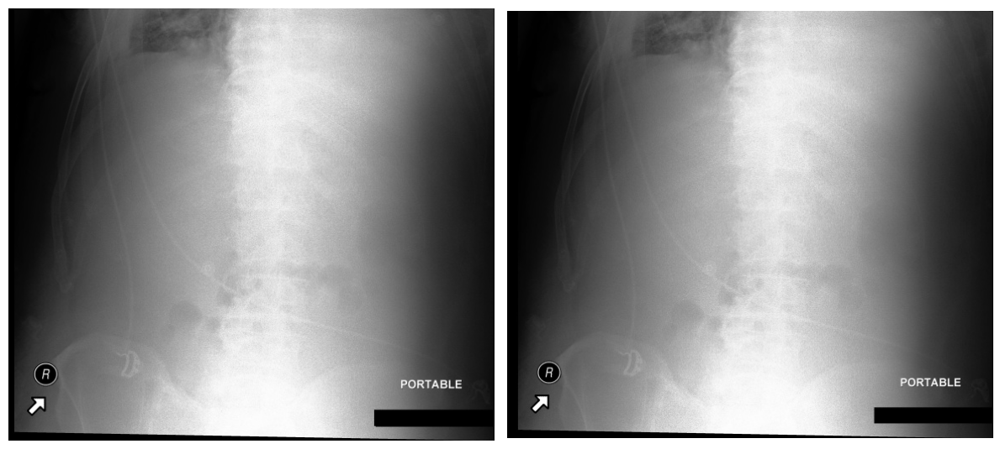

In [19]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 143655
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p16/p16278588/s58618823/72f7f157-bbe9d9f1-fabbaa07-90c6f759-8d671069.jpg


### Radiology Report

```
FINAL REPORT
 INDICATION:  ___ year old woman s/p  TAVR, evaluate for position of temporary
 RV pacing wire.
 
 TECHNIQUE:  Portable chest radiograph.
 
 COMPARISON:  Chest radiographs from ___ through ___.
 
 FINDINGS: 
 
 Since prior, ETT tube has been removed. A new heterogeneous opacity in the
 left upper lobe and more homogeneous opacity inferiorly with shift of the
 mediastinum to the left, suggests collapse.  There is mild pulmonary edema on
 the right. Pacer lead ends as expected in the right ventricle. Chest tube is
 unchanged in position.
 
 IMPRESSION: 
 
 New left lung collapse. Right ventricular pacing wire ends in expected
 location.
 
 NOTIFICATION:   The findings were discussed by Dr. ___ with ___
 ___ on the telephone on ___ at 15:00, 20 minutes after discovery of
 the findings.
```

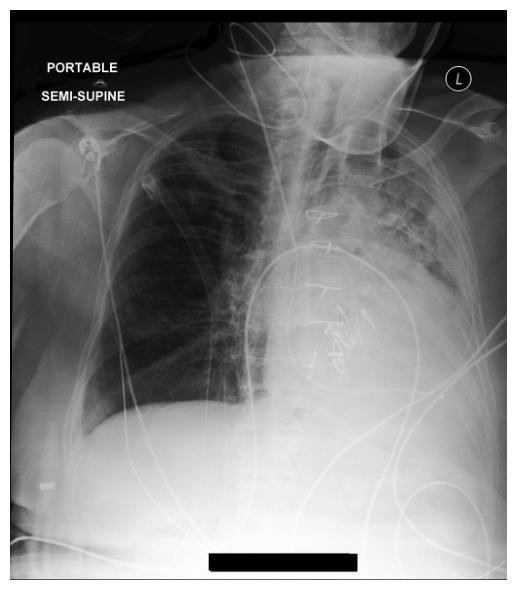

In [20]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 8358
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10192748/s56171531/60ce5819-4ffff81f-15a4a469-563eac26-52277a17.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10192748/s56171531/bb2076f5-f7822845-62a9493a-b904c992-ec721eee.jpg


### Radiology Report

```
FINAL REPORT
 CHEST RADIOGRAPH
 
 INDICATION:  Pleural effusions, chest tubes, evaluation.
 
 COMPARISON:  ___.
 
 FINDINGS:  As compared to the previous radiograph, there is a decrease in
 extent of the right pleural effusion with subsequent improved ventilation of
 the right lung bases.  On the left, effusion has fairly decreased.  Unchanged
 position of the chest tubes, unchanged course of the PICC line.  No evidence
 of pneumothorax.
```

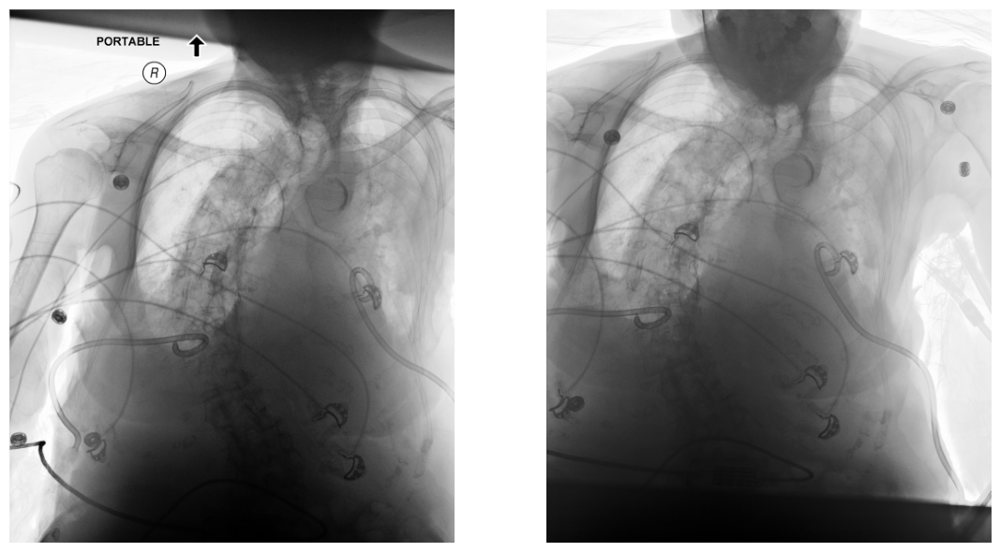

In [21]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 208557
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19674707/s59360766/27c92941-9d9d411d-95f1c56a-6183f4c5-79b4ebb9.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19674707/s59360766/b0bcf24e-3ba12086-d023e616-058eecf4-debfd5bf.jpg


### Radiology Report

```
FINAL REPORT
 EXAMINATION:  CHEST (PA AND LAT)
 
 INDICATION:  ___ year old man POD4 CABG  // effusion/atelectasis
 
 TECHNIQUE:  Chest PA and lateral
 
 COMPARISON:  ___
 
 FINDINGS: 
 
 Cardiomediastinal contours are normal.  Bibasilar atelectasis have improved
 still larger on the left. Small bilateral effusions are grossly unchanged
 larger on the left. There is no pneumothorax. Sternal wires are aligned.
 Patient is status post CABG.
 
 IMPRESSION: 
 
 Small bilateral pleural effusions with adjacent atelectasis larger on the
 left.
```

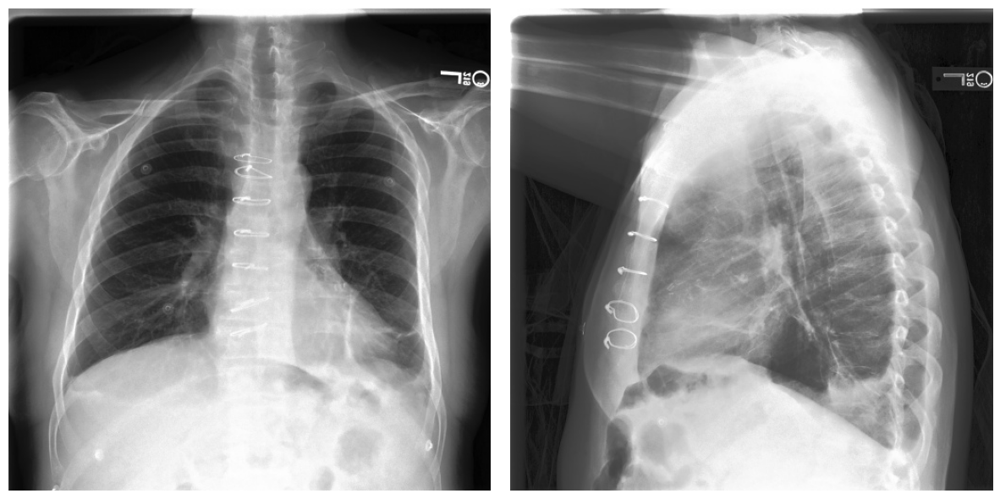

In [22]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 66359
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12996303/s59275537/0fa5d489-dfd0e531-292df3fb-d1ae606f-ce6bc428.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12996303/s59275537/4209f671-1f86dd44-50d8c0c3-4d04ac01-6b30f495.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12996303/s59275537/c84e1f45-1a749430-79c250b3-aca11eb3-22621748.jpg


### Radiology Report

```
FINAL REPORT
 TYPE OF EXAMINATION:  CHEST, FRONTAL AND LATERAL VIEWS AND LEFT-SIDED
 DECUBITUS.
 
 FINDINGS:  Patient's condition required examination in sitting semi-upright
 position using AP frontal and left lateral views.  An additional left-sided
 down decubitus film was obtained.  Comparison is made with the next preceding
 portable chest examination of ___.  The previously observed and
 described parenchymal densities in the right hemithorax remain and represent
 the patient's advanced lung cancer.  Mild mediastinal shift towards the right
 indicating lower lobe volume, appears unchanged.  Linear basal atelectasis on
 the left base as before and mild blunting of the left lateral pleural sinus is
 identified.  No evidence of new parenchymal infiltrates in the left
 hemithorax.  The lateral view demonstrates that the pleural effusion extends
 into the posterior pleural sinus, which appears blunted.  The left lateral
 decubitus image clearly demonstrates about 2-3 cm high fluid level along the
 lateral chest wall. An estimate suggests that this amounts to about 500 mL. 
 No pneumothorax can be identified on either side.
```

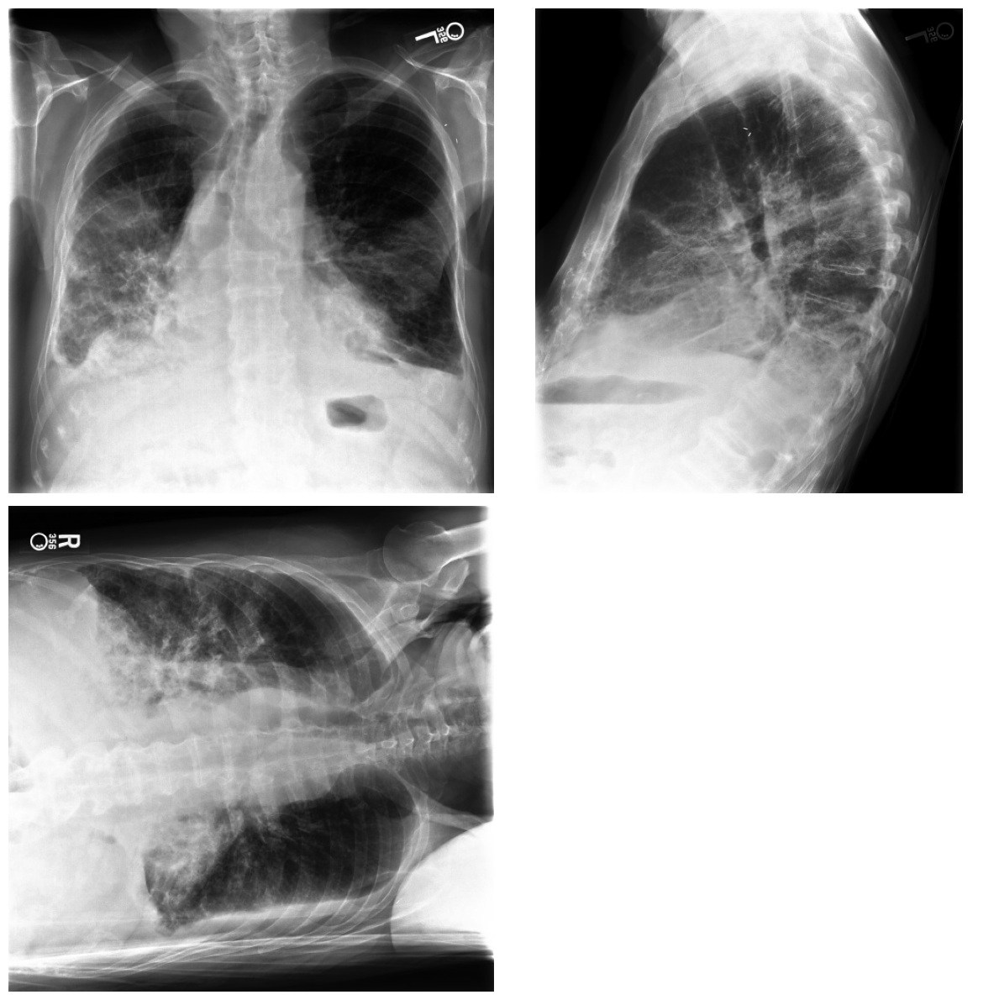

In [23]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 87531
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13326118/s50561247/fe0bf8dd-b8741342-4269ec7b-6272e52f-3724bb26.jpg


### Radiology Report

```
FINAL REPORT
 EXAMINATION:  CHEST (PORTABLE AP)
 
 INDICATION:  ___F s/p left anterior thoracotomy and pericardial window  //
 Pneumothorax, hemothorax      Pneumothorax, hemothorax
 
 IMPRESSION: 
 
 Right lung remains clear except for minimal atelectasis and small amount of
 pleural effusion.  Left mediastinal shift with complete opacification of the
 left hemithorax is unchanged.
```

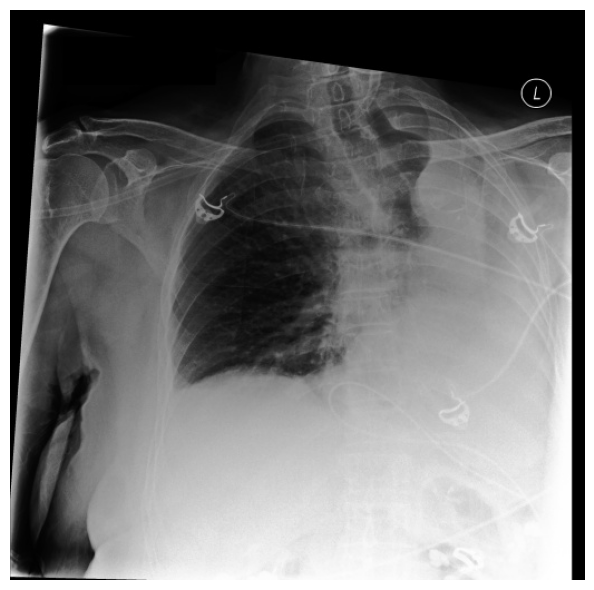

In [24]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 128785
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15816613/s56329030/9fc8cf67-27341d6b-2be6d5da-d2fcbe0e-cbdec09b.jpg


### Radiology Report

```
FINAL REPORT
 HISTORY:  Pleural effusions with new left chest tube.
 
 FINDINGS:  In comparison with the study of ___, with the new left chest tube
 in place, there is little change in the extensive opacification both on this
 side and on the opposite side.  Loculated left pleural effusion laterally is
 again seen.  Stable cardiomediastinal silhouettes.  There are bilateral
 opacifications bilaterally, especially in the central juxtahilar region.  This
 could well represent a combination of pulmonary vascular congestion and
 superimposed consolidation due to pneumonia.
```

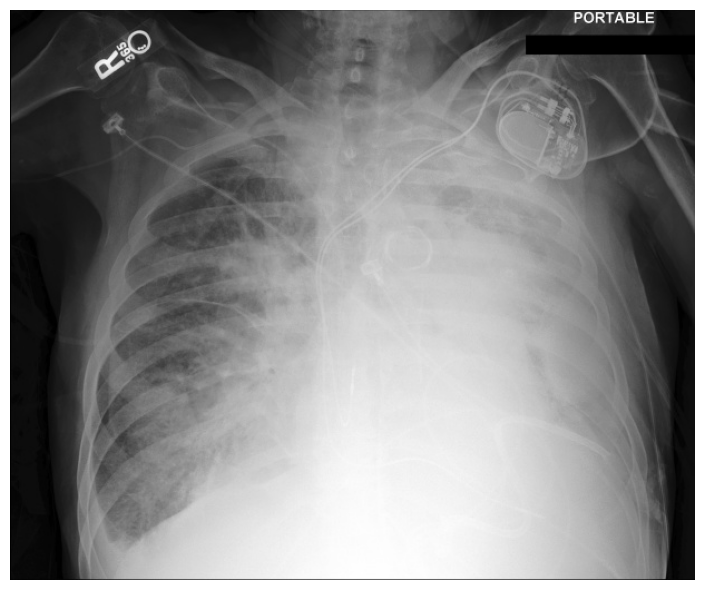

In [25]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 160629
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p17/p17418265/s58406499/772c2b2d-a66bcb2c-cf9cbded-89d047cc-6b8ca7a2.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p17/p17418265/s58406499/b80ffa7d-92c2f3f8-cb079e7f-29f7d402-43ae9ebb.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p17/p17418265/s58406499/f0ccb3d8-45bfe616-17b93e61-b18995f3-9fc5a09e.jpg


### Radiology Report

```
WET READ: ___ ___ ___ 2:32 AM
  No pneumonia.
 ______________________________________________________________________________
                                 FINAL REPORT
 INDICATION:  History: ___F with fever on chemo  // pna?
 
 TECHNIQUE:  Chest PA and lateral
 
 COMPARISON:  Chest radiograph dated ___.
 
 FINDINGS: 
 
 Lungs are well-expanded and clear.  The cardiac silhouette is not enlarged. 
 Aorta is mildly tortuous.  No pleural effusion, consolidation, or
 pneumothorax.
 
 IMPRESSION: 
 
 No pneumonia.
```

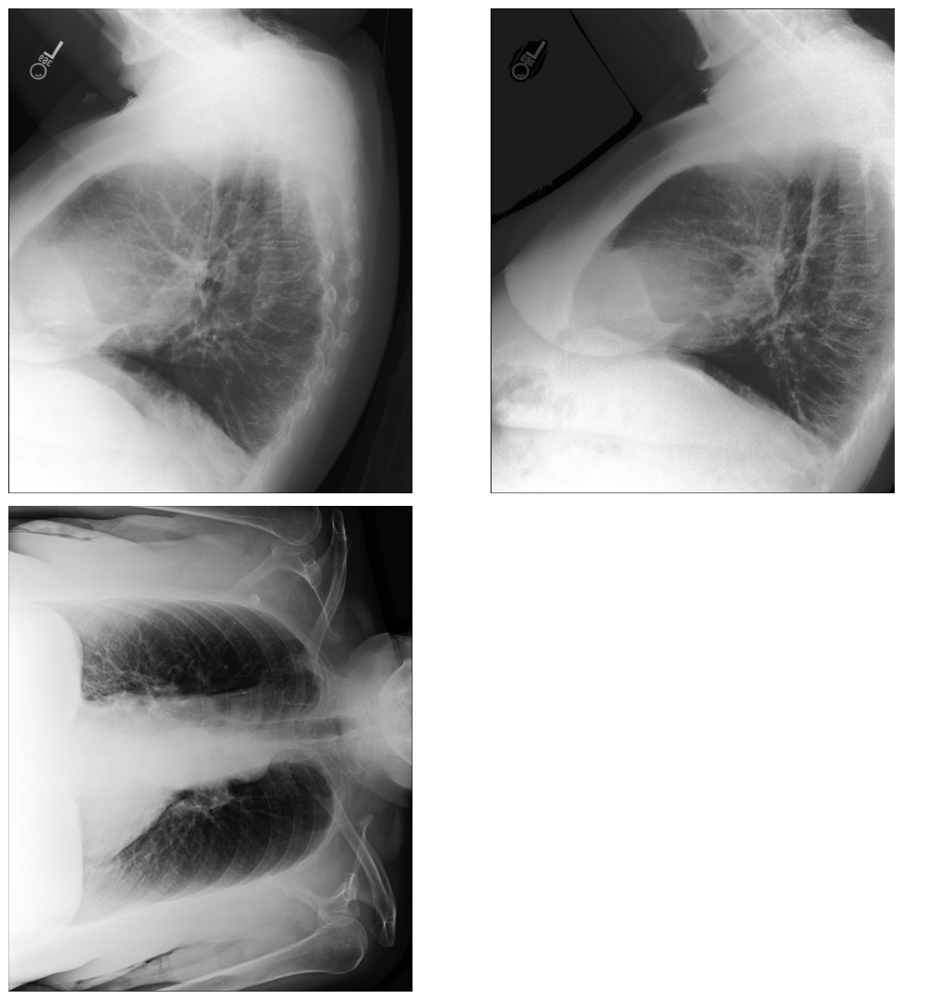

In [26]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 210611
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19963140/s56828395/792e6626-609fe86e-268804b2-c57c6b64-ed4c392c.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19963140/s56828395/eed20f68-2df330e9-2d59aeac-95286908-fcdd1586.jpg


### Radiology Report

```
FINAL REPORT
 EXAMINATION:  CHEST (PORTABLE AP)CHEST (PORTABLE AP)i
 
 INDICATION:  ___ year old man with lung CA, s/p exploratary L thoracotomy  //
 s/p L thoracotomy  POD 1
 
 COMPARISON:  Chest radiographs ___ and postoperatively ___.
 
 IMPRESSION: 
 
 Greater generalize infiltration in the left lung is most likely due either to
 bleeding or lymphatic congestion. New consolidation at the base of the left
 lower lobe probably atelectasis. Left apical pleural drain still in place. No
 appreciable pleural effusion or pneumothorax. Right lung clear.
```

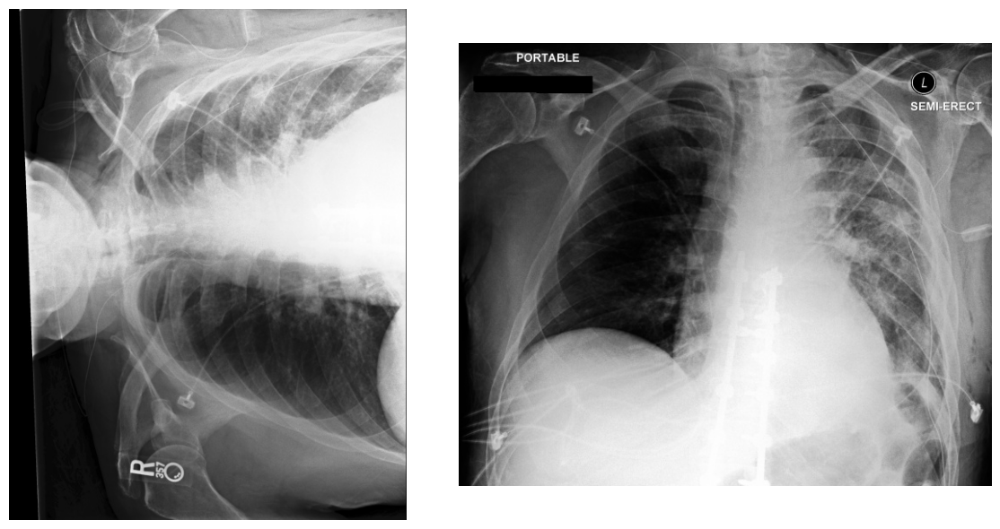

In [27]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 19512
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10851976/s57994807/9a81ad90-b1dba82b-e63a0bfc-763420ec-33a91a54.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10851976/s57994807/df9342c5-6f351dc1-7cc1e972-0286ca7f-ba976727.jpg


### Radiology Report

```
FINAL REPORT
 INDICATION:  ___F with cdough, fever  // presence of infiltrate, edema
 
 TECHNIQUE:  AP and lateral views of the chest.
 
 COMPARISON:  ___.
 
 FINDINGS: 
 
 The lungs are clear without focal consolidation, effusion, or edema. Calcific
 density again projects over the left lung base, likely a granuloma. The
 cardiomediastinal silhouette is stable. Thoracic S-shaped scoliosis is noted.
 No acute osseous abnormalities identified.
 
 IMPRESSION: 
 
 No acute cardiopulmonary process.
```

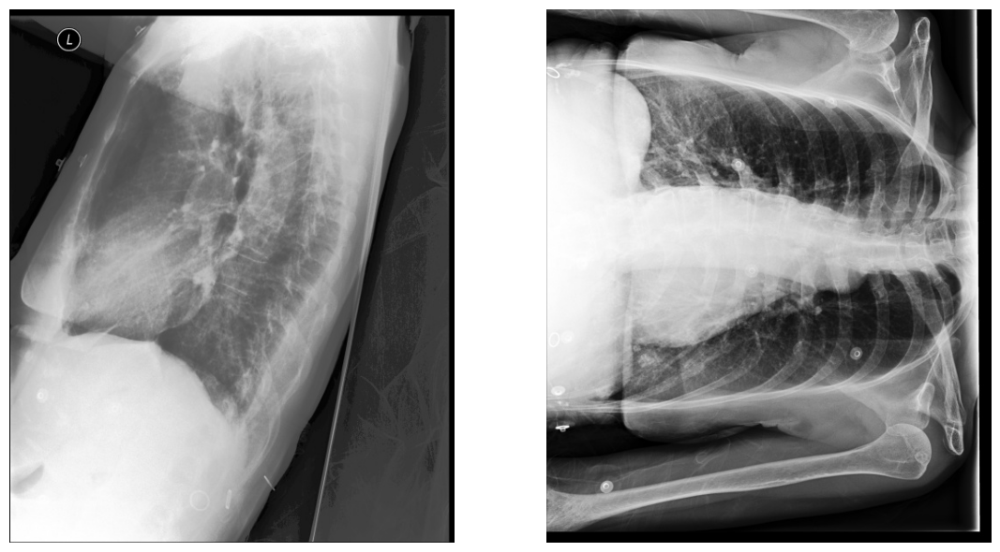

In [28]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 101524
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p14/p14591912/s51275514/b902b7fb-e9888f58-32b99d83-a705ba1a-5a2dfa88.jpg


### Radiology Report

```
FINAL REPORT
 EXAMINATION:  CHEST (PORTABLE AP)
 
 INDICATION:  NG tube placement  // Confirm NG tube placement      Confirm NG
 tube placement
 
 IMPRESSION: 
 
 Comparison to ___.  The feeding tube has been minimally pulled
 back.  .  The right pectoral Port-A-Cath is in correct position.  Unchanged
 bilateral parenchymal opacities, notably on the right.  An atelectasis at the
 left lung bases has minimally improved.  No other relevant changes.
```

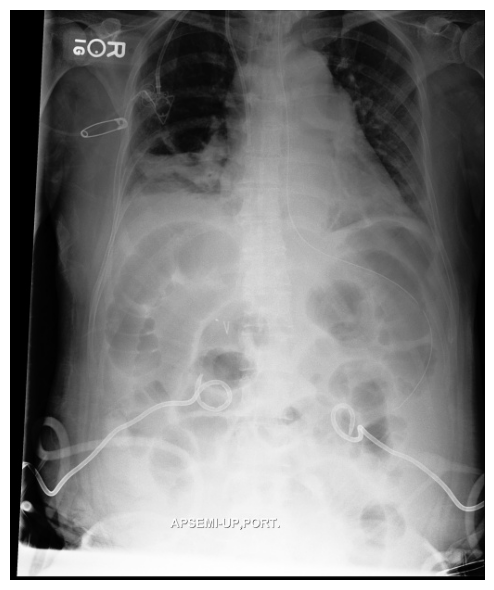

In [29]:
ridx = random.choice(train_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

# 2) Examples from MIMIC-CXR validation set

ridx: 27919
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11842519/s51581083/e9977922-0c45547e-2c72b894-91042335-31f132ea.jpg


### Radiology Report

```
FINAL REPORT
 EXAMINATION:  CHEST (PORTABLE AP)
 
 INDICATION:  ___ year old woman with CHF, pulm hypertension  // effusion, edema
 effusion, edema
 
 IMPRESSION: 
 
 Comparison to ___.  Minimal decrease in extent of the
 pre-existing right basal parenchymal opacities.  Moderate cardiomegaly. 
 Stable appearance of the vertebral fixation devices.  A minimal right pleural
 effusion is unchanged in extent and severity.
```

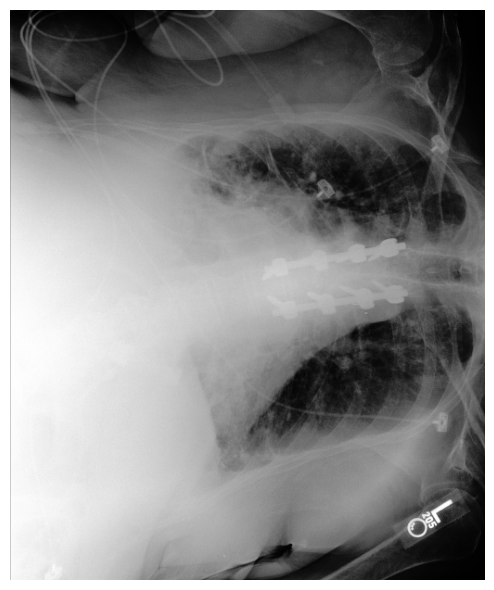

In [30]:
ridx = random.choice(val_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 193612
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p18/p18232123/s55748803/707a7540-cb3bf051-5a339e77-d0bf7c09-1031feb5.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p18/p18232123/s55748803/93c4c79c-b00b5507-3b1a9853-af840f9b-b413930a.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p18/p18232123/s55748803/a6e77d86-03752397-ff4284ee-c2bc16dd-feff8cee.jpg


### Radiology Report

```
FINAL REPORT
 HISTORY:  ___-year-old man with past medical history of hypertension status
 post MVA with right shoulder pain, lumbar pain, C-spine tenderness.  Rule out
 fracture or subluxation.
 
 COMPARISON:  None available. 
 
 TECHNIQUE:  PA and lateral chest radiographs.  
 
 FINDINGS:
 
 The cardiomediastinal and hilar contours are within normal limits.  The lungs
 are well expanded and clear.  There is no focal consolidation, pleural
 effusion or pneumothorax.  There are mild degenerative changes within the
 shoulders, right greater than left.  Note is made of inferior spurring of the
 glenohumeral joint on the right. 
 
 IMPRESSION: No radiographic evidence of an acute cardiopulmonary process.
```

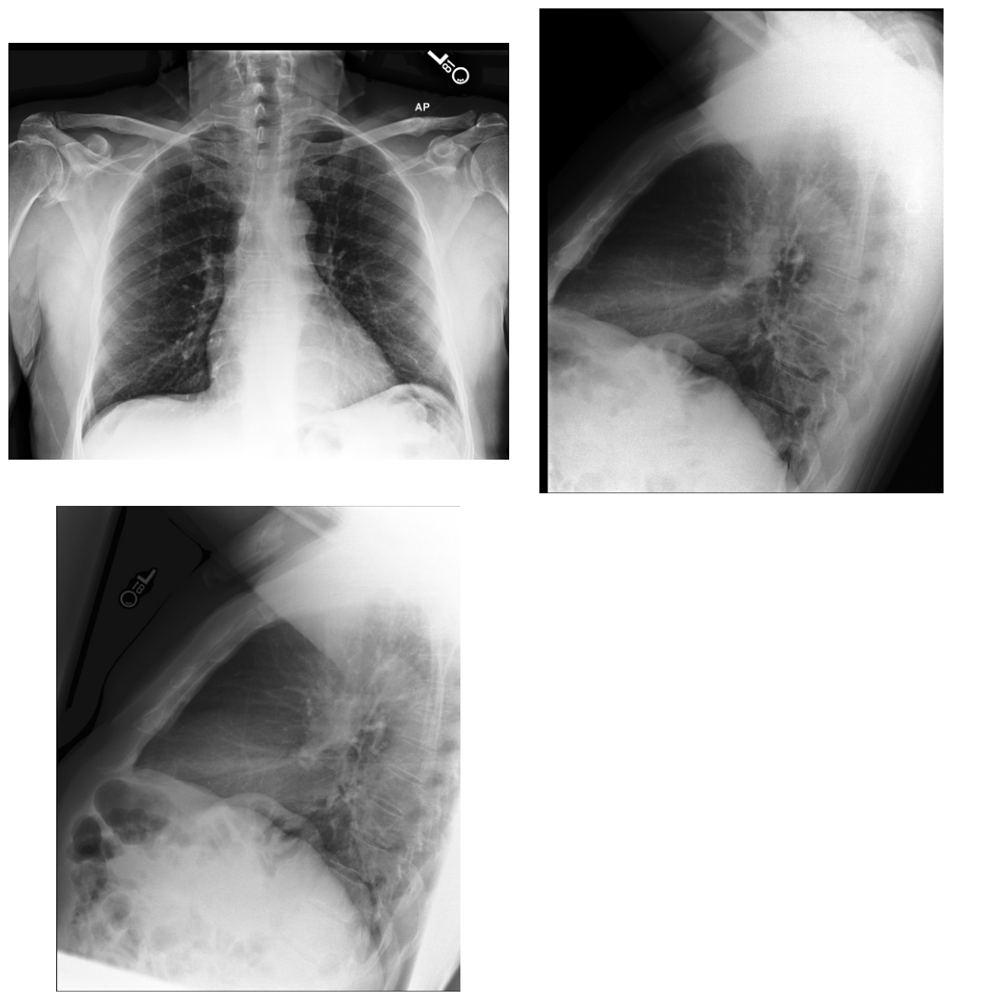

In [31]:
ridx = random.choice(val_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 140181
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p16/p16456728/s52571563/69c29944-ec41cc80-daae3d71-357064e8-d6068d68.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p16/p16456728/s52571563/cfaacd99-7ac63214-6b328e63-b94c98af-9872e989.jpg


### Radiology Report

```
FINAL REPORT
 EXAMINATION:  CHEST RADIOGRAPH ___
 
 INDICATION:  ___ y/o F p/w 1x week of productive cough, fevers/chills.  //
 ?acute intrapulmonary process ?consolidation c/w PNA
 
 TECHNIQUE:  Chest PA and lateral
 
 COMPARISON:   Comparison is made to chest radiograph from ___.
 
 FINDINGS: 
 
 The lung volumes are somewhat low, accentuating retrocardiac vascular
 markings. No discrete consolidation, pleural effusion, pneumothorax, or
 pulmonary edema is identified. The heart size is normal. Suggestion of a
 slight impression upon the right aspect of the trachea at the level of the
 thoracic inlet is noted.
 
 IMPRESSION: 
 
 No acute cardiopulmonary process. Suggestion of slight fullness at the right
 thoracic inlet may be due to a thyroid nodule or thyroiditis. Correlation with
 clinical exam is recommended.
```

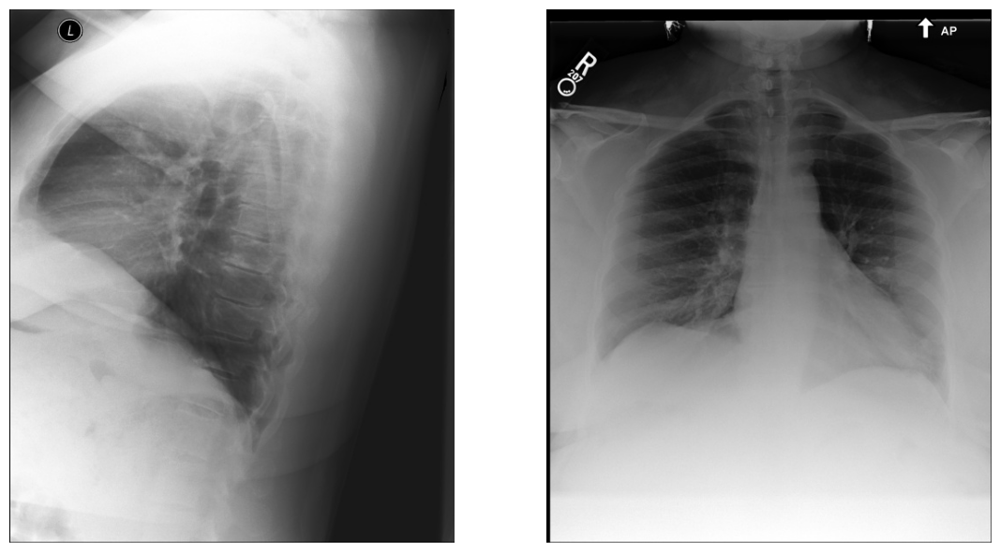

In [32]:
ridx = random.choice(val_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 89152
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13722528/s52066292/3fec4c61-f3e07a20-1bfa9956-78c0e16c-69d76fe2.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13722528/s52066292/4533a58b-b915b5c9-18ce3efd-15d23267-5da8b20b.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13722528/s52066292/8fc640a2-1d6e4787-685d3061-db38a40a-ad7c2e6c.jpg


### Radiology Report

```
FINAL REPORT
 PA AND LATERAL CHEST ON ___
 
 HISTORY:  ___-year-old man with recent pneumonia on prior imaging.
 
 IMPRESSION:  PA and lateral chest compared to ___ and ___:
 
 Heterogeneous opacification in the right upper lobe in ___ is most
 readily explained by pneumonia.  That has largely resolved, but there is still
 irregular opacification, best appreciated on the lateral view as well as the
 possibility of a ___-mm wide nodule projecting just anterior to the ascending
 thoracic aorta.  For that reason, I would recommend chest CT scanning if
 nothing else to establish baseline appearance of hyperinflated lungs, probably
 due to emphysema.  Heart size is top normal, but there is no pulmonary or
 mediastinal vascular engorgement, edema or pleural effusion.
```

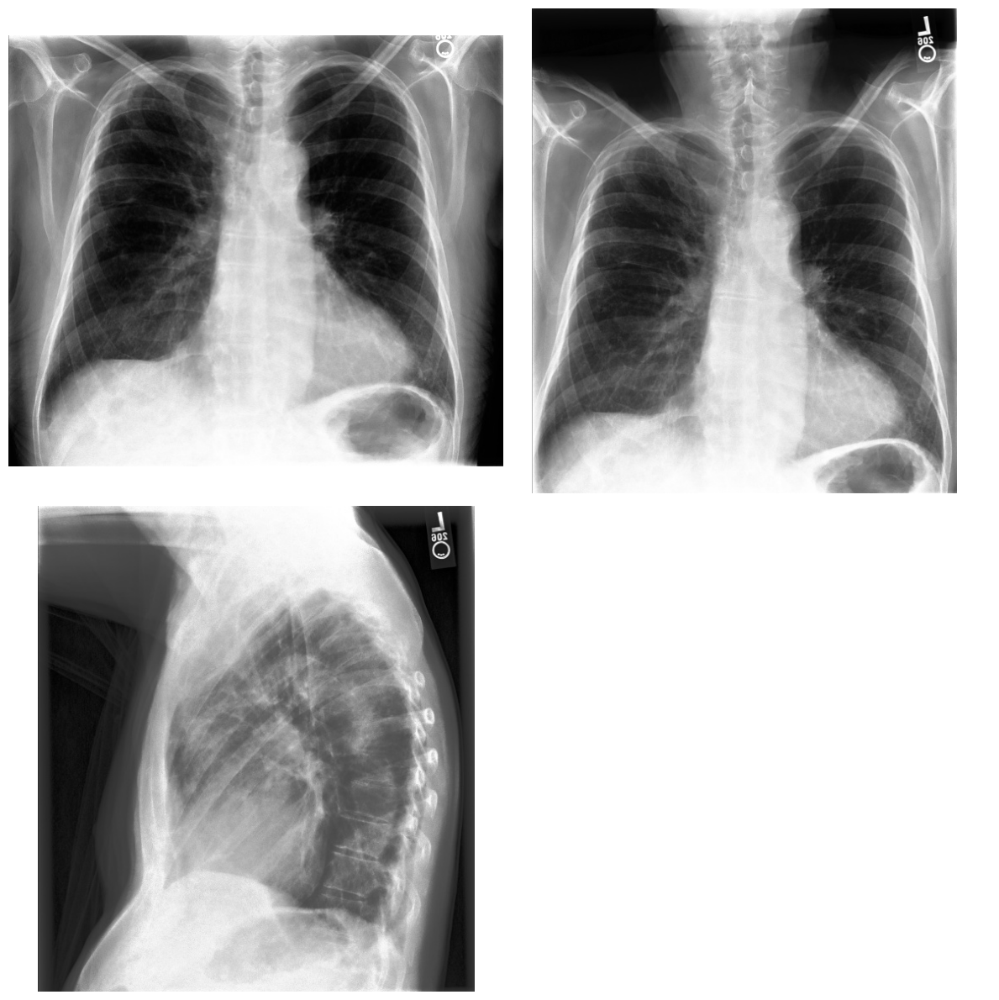

In [33]:
ridx = random.choice(val_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 86904
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13171410/s55806461/d4faa158-9dca8977-f02a356f-0897293a-813bc241.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13171410/s55806461/d9db020c-127f5d05-0b15114d-f9441c91-1080c498.jpg


### Radiology Report

```
FINAL REPORT
 AP CHEST, 7:57 A.M., ___
 
 HISTORY:  Heart failure after MI, with fever, question pulmonary edema or
 infection.
 
 IMPRESSION:  AP chest compared to ___ through ___:
 
 Severe pulmonary edema and moderate-to-large bilateral pleural effusion are
 all increasing, obscuring what might have been an earlier pneumonia in the
 left lung laterally.  Heart is mildly enlarged.  No pneumothorax.  Right
 jugular line ends low in the SVC.
```

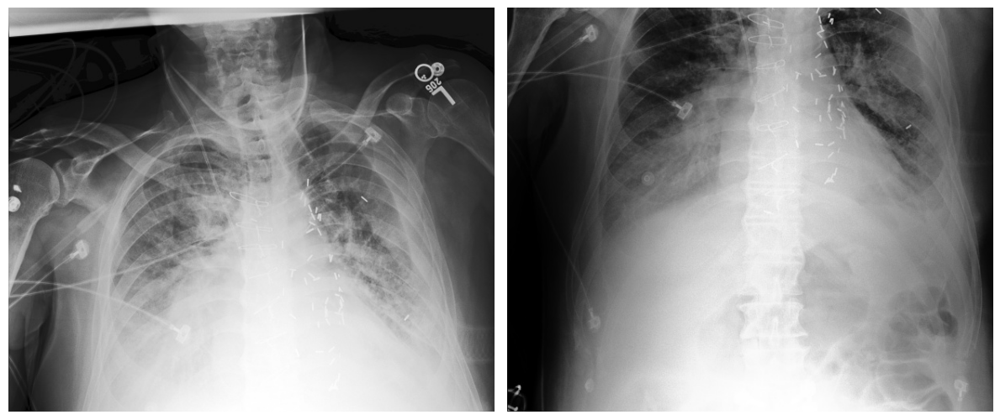

In [34]:
ridx = random.choice(val_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

# 3) Examples from MIMIC-CXR test set

ridx: 75553
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13352405/s56801982/2ef86c0f-55bf4440-5098b3fc-b9435636-38b5b69c.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13352405/s56801982/6028cc4d-90f984dc-0fd05dbe-2f10dde8-229e32e0.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13352405/s56801982/841a2be5-4e74e5d9-2a001109-8a1a6b21-881729d4.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13352405/s56801982/8940c466-c9e39762-22971350-b783808a-15d5a1bc.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13352405/s56801982/dedc8034-9860140a-df88abb0-b9b2fab5-3265641f.jpg


### Radiology Report

```
FINAL REPORT
 CHEST X-RAY
 
 INDICATION:  ___-year-old man status post right thoracotomy, decortication, now
 with chest tube x 3 to water seal. 
 
 COMPARISON:  Chest radiograph dated ___.
 
 TECHNIQUE:  Frontal and lateral radiographs.
 
 FINDINGS:  The three chest tubes remain stable in position compared to the
 prior study.  The appearance of the right hemithorax including the clips is
 unchanged as compared to the previous examination; however, it appears that
 the soft tissue collection of air has increased in size.  There is increased
 gas filling of colon interposed between the chest wall and the liver, and
 continued elevation of the right hemidiaphragm.  Unchanged normal appearance
 of the cardiac silhouette and the left lung.  No current evidence of
 pneumothorax. 
 
 IMPRESSION:  Findings remain stable compared to the previous study with the
 exception of increased air with the soft tissues of the right lateral chest
 wall.
```

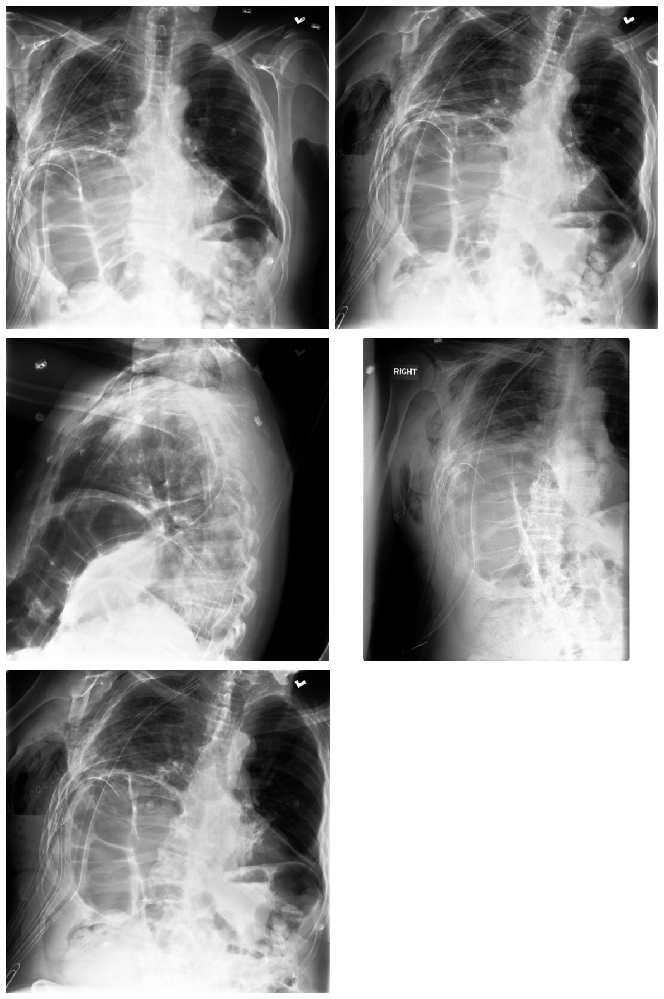

In [37]:
ridx = random.choice(test_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 31319
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11569042/s57778607/4c1ef8d6-96ad17ad-becaa578-175f9fc2-24c4304e.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11569042/s57778607/aac431c4-71ce2760-10747748-4fd37654-0f440dd6.jpg


### Radiology Report

```
FINAL REPORT
 INDICATION:  Achalasia, status post NG tube placement into esophagus. Please
 confirm NG tube in esophagus.
 
 COMPARISON:  Comparison is made to frontal chest radiograph performed the same
 day as well as CT chest performed ___.
 
 FINDINGS:  Nasogastric catheter is seen coursing through the dilated
 esophagus, consistent with achalasia, and appears to terminate in the
 esophagus at the level of the posterior costophrenic sulcus.  Otherwise, the
 exam is unchanged with unremarkable mediastinal, hilar and cardiac contours. 
 Lungs are clear.  No pleural effusion or pneumothorax is evident.
 
 IMPRESSION:
 Enteric catheter coursing through dilated esophagus, ending in the distal
 esophagus at the level of the right posterior costophrenic angle.
```

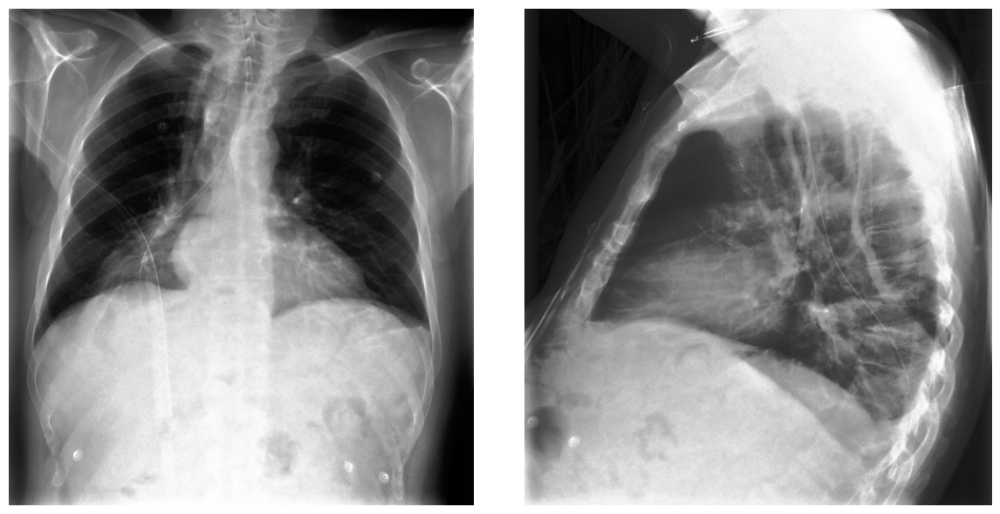

In [38]:
ridx = random.choice(test_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 143930
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p16/p16853729/s55739720/0b8983cf-a43a8452-8286dd0b-c2f8f8ba-c20f59fe.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p16/p16853729/s55739720/53b32671-685e3433-612784a3-6c684cd8-e06dd901.jpg


### Radiology Report

```
FINAL REPORT
 CHEST RADIOGRAPH
 
 TECHNIQUE:  PA and lateral views of chest were reviewed in comparison with
 prior radiograph from ___.
 
 FINDINGS:  Both the lungs are well expanded.  No focal pulmonary opacity 
 concerning for pneumonia.  No pleural effusion or pneumothorax.  The heart
 size is top normal.  Cardiomediastinal silhouette is unremarkable.
 
 IMPRESSION:  No acute cardiopulmonary process.
```

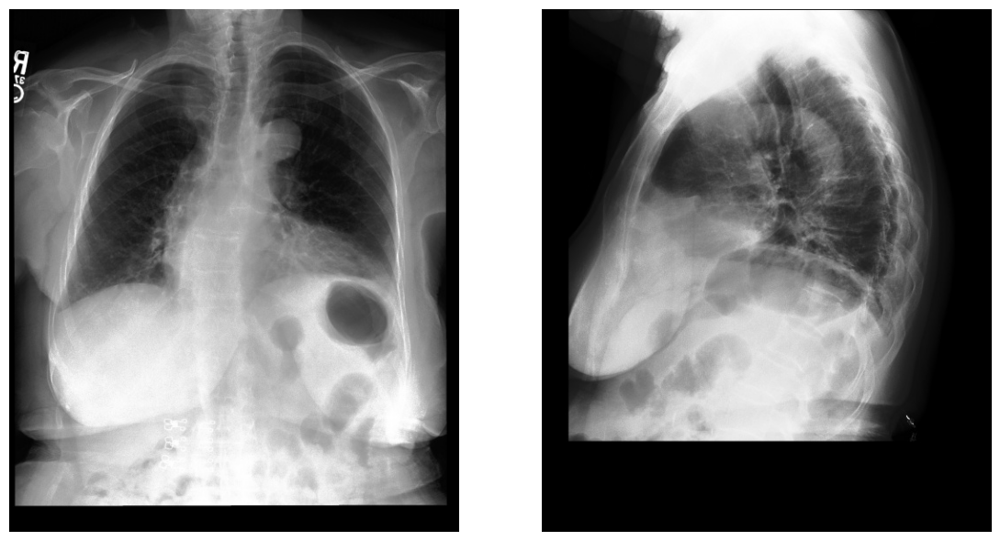

In [40]:
ridx = random.choice(test_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

ridx: 214355
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19182863/s56745275/a6de5f6f-7cb598cd-9751bdc7-71682995-e07927d3.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19182863/s56745275/d59037ae-76814c45-ab38e8da-7b58f204-debaa6b9.jpg


### Radiology Report

```
FINAL REPORT
 REASON FOR EXAMINATION:  Evaluation of the patient with renal allograft and
 Clostridium difficile.
 
 Portable AP radiograph of the chest was compared to ___.
 
 There is interval increase in right pleural effusion, currently large,
 associated with atelectasis/consolidation.  Interstitial pulmonary edema has
 slightly progressed and there are also new/progressing opacities in the left
 mid and lower lung that might reflect infectious process as well.  The left
 internal jugular line tip is in the persistent left SVC, unchanged in
 appearance.  The replaced valves, tricuspid and aortic are redemonstrated.
```

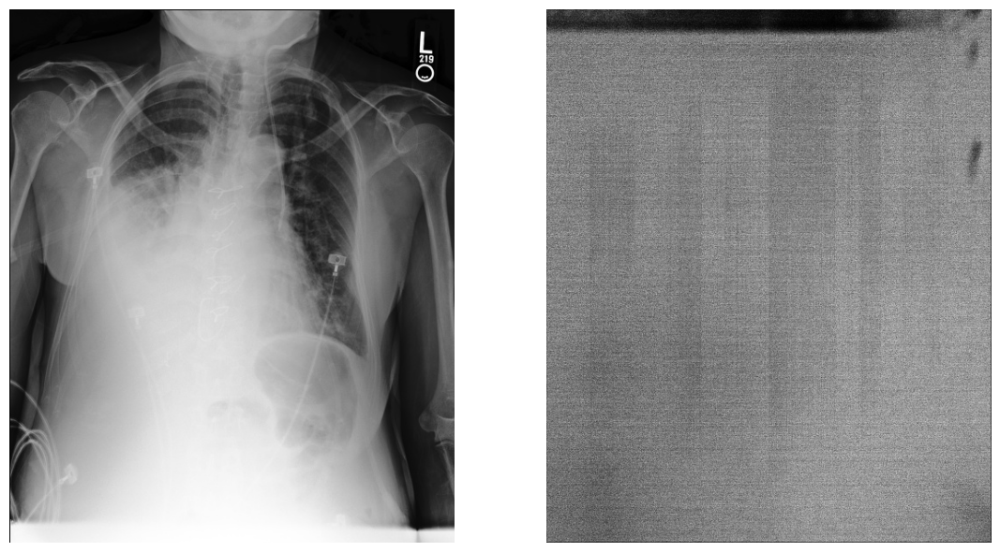

In [41]:
ridx = random.choice(test_ridxs_with_noisy_images)
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)

# 4) Other examples

ridx: 9321
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10046166/s50051329/427446c1-881f5cce-85191ce1-91a58ba9-0a57d3f5.jpg
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10046166/s50051329/abea5eb9-b7c32823-3a14c5ca-77868030-69c83139.jpg


### Radiology Report

```
FINAL REPORT
 INDICATION:  ___-year-old male with history of metastatic melanoma, presenting
 with confusion and somnolence.  Evaluate for acute cardiopulmonary process.
 
 COMPARISON:  ___.
 
 TECHNIQUE:  AP upright and lateral chest radiograph.
 
 FINDINGS:  Lateral view somewhat limited due to overlying motion artifact. The
 lungs are low in volume.  There is no focal airspace consolidation to suggest
 pneumonia.  A 1.2-cm calcified granuloma just below the medial aspect of the
 right hemidiaphragm is unchanged from prior study.  No pleural effusions or
 pulmonary edema. There is no pneumothorax.
 
 The inferior sternotomy wire is fractured but unchanged. Surgical clips and
 vascular markers in the thorax are related to prior CABG surgery.
 
 IMPRESSION:  No evidence of acute cardiopulmonary process.
```

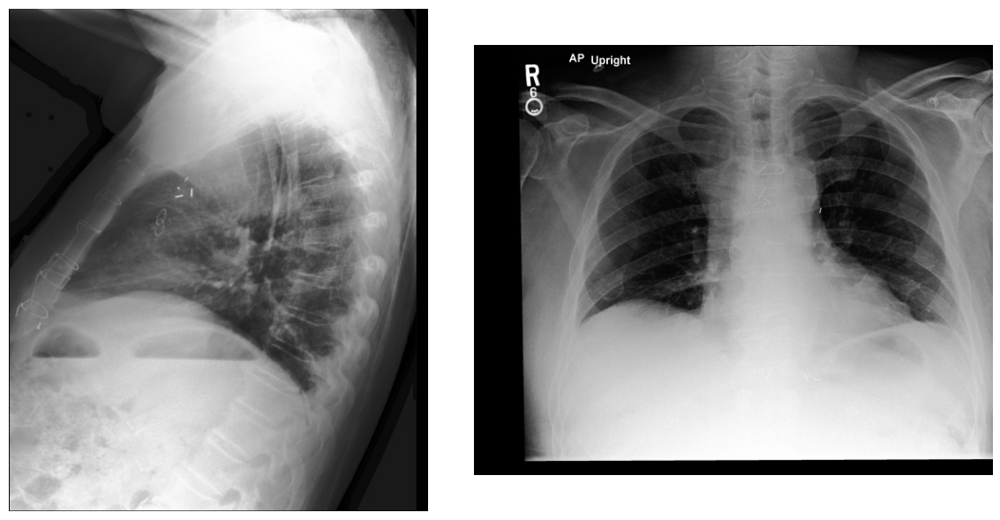

In [42]:
ridx = 9321
report_text, image_paths = get_report_text_and_images(ridx)
print(f'ridx: {ridx}')
for image_path in image_paths:
    print(image_path)
visualize_report_and_images(report_text, image_paths)